In [2]:
import numpy as np
import PIL.Image
import skimage.filters
import matplotlib.pyplot as plt
import cv2
import skimage.transform
import scipy.ndimage
from tqdm import tqdm_notebook as tqdm

In [3]:
def hls2hemi(hls): # input is arr of size M, N, 3. Last axis is in hls # hls ranges: 0,180; 0,255; 0,255 
    z_unscaled = (hls[:,:,1] - 128)
    z_unscaled = ((z_unscaled / 128) * (z_unscaled <= 0)) + ((z_unscaled / 127) * (z_unscaled > 0))
    g = 1-(np.fabs(z_unscaled) + ((1 - np.fabs(z_unscaled)) * (hls[:,:,2] / 255)))
    z = np.sqrt(1-(g*g))*(1-(hls[:,:,2] / 255)) * ((2*(z_unscaled>0))-1)
    r_sq = (1 - (z*z) - (g*g))
    r_sq[r_sq < 0] = 0 # for numerical errors
    r = np.sqrt(r_sq)
    theta = (hls[:,:,0]/90) * np.pi
    hemi = np.stack([r * np.cos(theta), r * np.sin(theta), z, g], axis=2)
    return hemi

# 1. RGB to 4D Hemisphere

(768, 1152, 3) float32


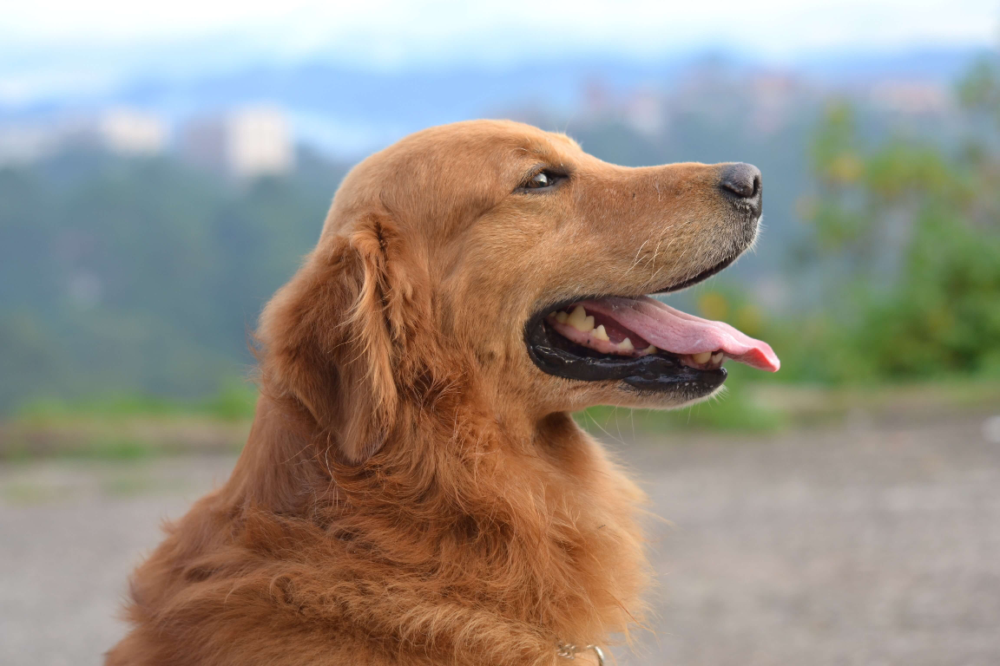

In [21]:
im = PIL.Image.open('dog.jpg')
im = im.resize((im.size[0]//4, im.size[1]//4))
arr = cv2.cvtColor(np.array(im), cv2.COLOR_RGB2HLS).astype(np.float32)
arr_rgb = np.array(im)
print(arr.shape, arr.dtype)
im

In [22]:
hemi = hls2hemi(arr)

In [23]:
hemi.shape

(768, 1152, 4)

# 2. Defining Filters

In [186]:
filters = []
for sigma in [1, 2, 4, 8, 16]:
    second_sigma = sigma
    f = np.zeros((sigma*4+1,sigma*4+1))
    f[sigma*2,sigma*2] = 1
    while second_sigma >= 1:
        blurred = skimage.filters.gaussian(f, sigma=[second_sigma, sigma])
        if second_sigma != sigma:
            if second_sigma == sigma/2:
                for angle in range(0, 180, 20):
                    new_filter = skimage.transform.rotate(blurred, angle)
                    filters.append(new_filter / new_filter.sum())
            else:
                for angle in range(0, 180, 10):
                    new_filter = skimage.transform.rotate(blurred, angle)
                    filters.append(new_filter / new_filter.sum())
        else:
            blurred = blurred / blurred.sum()
            filters.append(blurred)
        second_sigma = second_sigma / 2
len(filters)

149

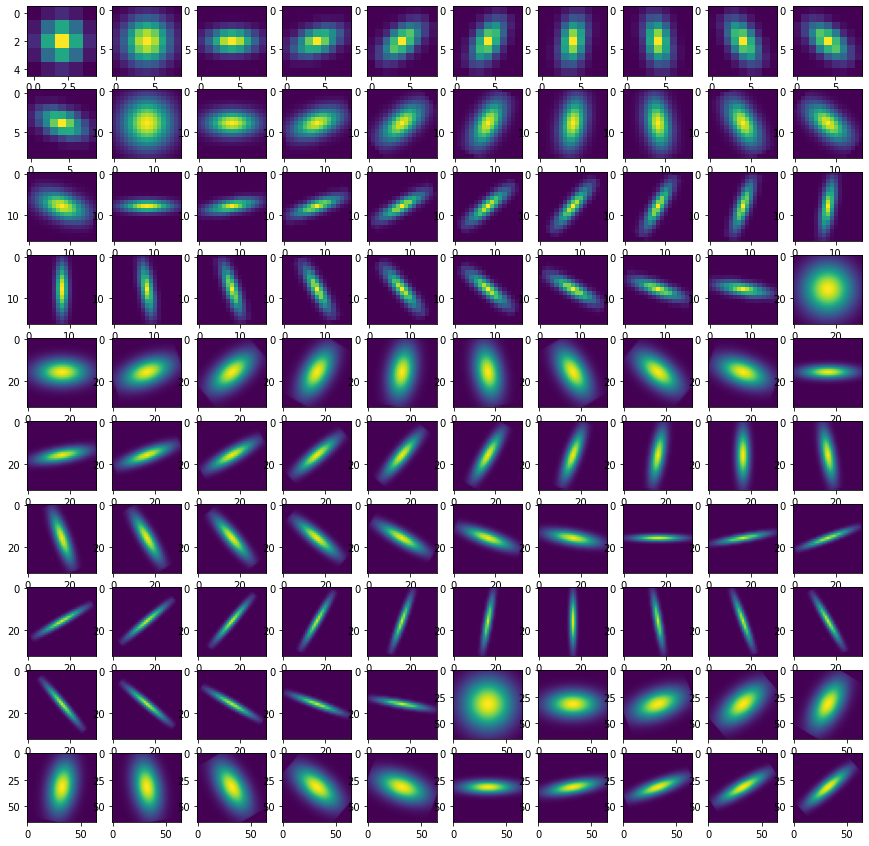

In [187]:
f, axarr = plt.subplots(10,10, figsize=(15,15))
for i in range(10):
    for j in range(10):
        axarr[i,j].imshow(filters[i*10+j])

# 3. Convolution

In [188]:
# TODO: speed this up with FFTs
sim_scores = []
for f in tqdm(filters):
    conv = np.stack([scipy.ndimage.convolve(hemi[:,:,0], f),
              scipy.ndimage.convolve(hemi[:,:,1], f),
              scipy.ndimage.convolve(hemi[:,:,2], f),
              scipy.ndimage.convolve(hemi[:,:,3], f)], axis=2)
    sim_score = conv * hemi
    sim_score = sim_score.sum(axis=2)
    sim_scores.append(sim_score.copy())

/home/alex/miniconda3/envs/hemi/lib/python3.7/site-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/149 [00:00<?, ?it/s]

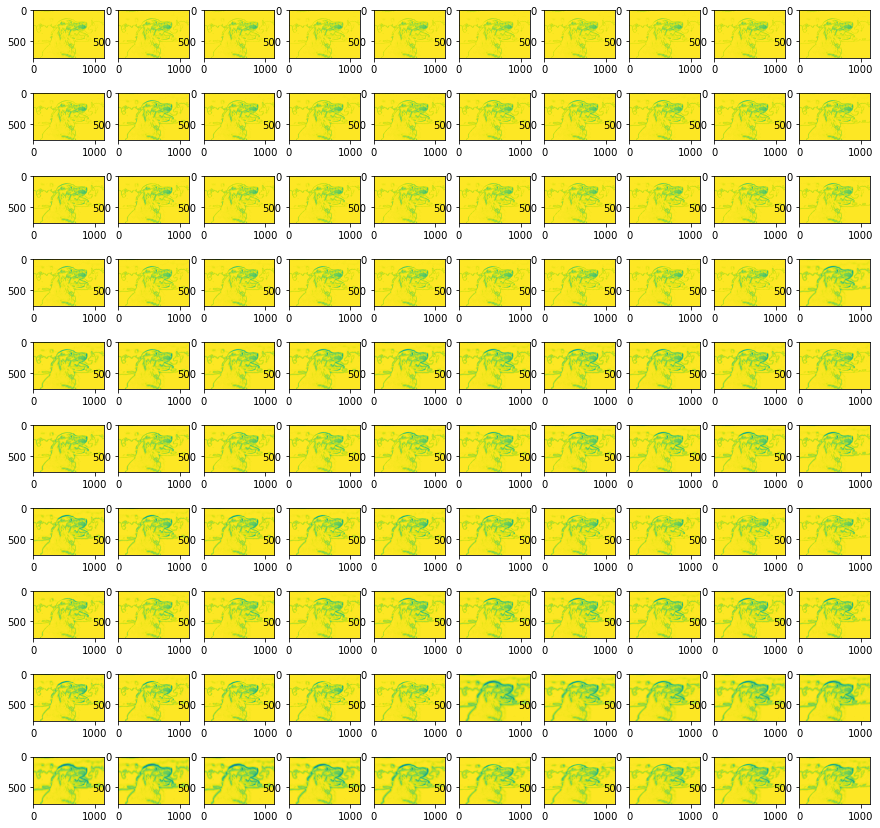

In [27]:
f, axarr = plt.subplots(10,10, figsize=(15,15))
for i in range(10):
    for j in range(10):
        axarr[i,j].imshow(sim_scores[i*10+j])

In [164]:
filter_info_score = [-np.sqrt((x*x).sum()) for x in filters]

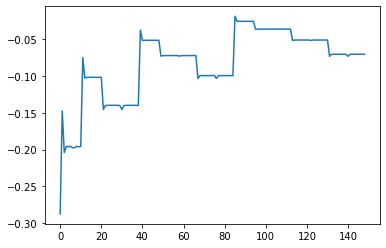

In [29]:
plt.plot(filter_info_score)

In [165]:
sim_scores = np.array(sim_scores)

In [70]:
plt.figure(figsize=(15,15))
plt.imshow(sim_scores[:50,:,:].max(axis=0))
plt.colorbar()

(768, 1152)

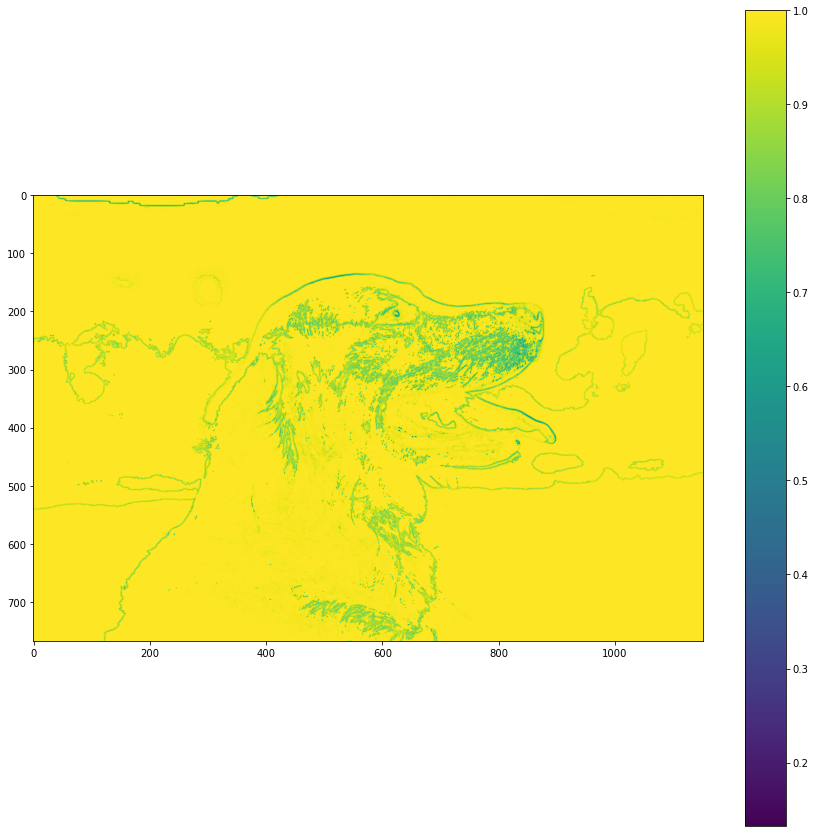

In [71]:
plt.figure(figsize=(15,15))
plt.imshow(sim_scores[:,:,:].max(axis=0))
plt.colorbar()

(array([1.0000000e+00, 5.0000000e+00, 3.0000000e+00, 6.0000000e+00,
        7.0000000e+00, 1.1000000e+01, 2.0000000e+01, 2.1000000e+01,
        2.1000000e+01, 2.9000000e+01, 6.4000000e+01, 6.8000000e+01,
        1.1100000e+02, 1.3300000e+02, 1.7500000e+02, 2.2700000e+02,
        2.5100000e+02, 2.4400000e+02, 2.7000000e+02, 2.4100000e+02,
        2.3600000e+02, 2.5700000e+02, 2.5500000e+02, 2.8000000e+02,
        3.1500000e+02, 3.1600000e+02, 3.8500000e+02, 3.6800000e+02,
        3.9800000e+02, 4.7900000e+02, 5.4400000e+02, 5.7600000e+02,
        8.0200000e+02, 1.3030000e+03, 1.6420000e+03, 2.3410000e+03,
        3.2070000e+03, 3.9830000e+03, 5.0190000e+03, 6.2020000e+03,
        7.6140000e+03, 8.7310000e+03, 9.6320000e+03, 1.0508000e+04,
        1.1219000e+04, 1.2609000e+04, 1.4334000e+04, 1.5810000e+04,
        1.7463000e+04, 1.9384000e+04, 2.1192000e+04, 2.3373000e+04,
        2.5682000e+04, 2.8331000e+04, 3.1238000e+04, 3.5272000e+04,
        3.9795000e+04, 4.3398000e+04, 4.8801000e

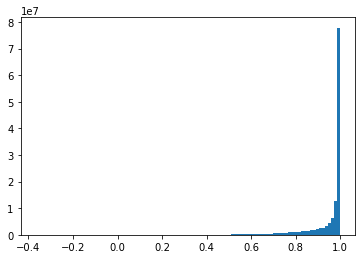

In [32]:
plt.hist(sim_scores.flatten(), bins=100)

# Various Feature Extraction Methods

In [166]:
# selects best feature for each location 
# best is closest to 0.999 or largest filter_info_score above 0.999
best_features = []
for i in tqdm(range(sim_scores[0].shape[0])):
    for j in range(sim_scores[0].shape[1]):
        cell_best = (0, i, j, sim_scores[0,i,j], filter_info_score[0])
        for idx in range(1, len(filters)):
            if not ((59 <= idx <= 84) or idx >= 112) or True:
                if sim_scores[idx,i,j] >= 0.996:
                    if (cell_best[3] < 0.996) or (cell_best[4] < filter_info_score[idx]):
                        cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx])
                elif cell_best[3] < sim_scores[idx,i,j]:
                    cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx])
        best_features.append(cell_best)

/home/alex/miniconda3/envs/hemi/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/768 [00:00<?, ?it/s]

In [105]:
# selects best feature for each location 
# best is closest to 0.999 or largest filter_info_score above 0.999
best_features = []
for i in tqdm(range(sim_scores[0].shape[0])):
    for j in range(sim_scores[0].shape[1]):
        cell_best = (0, i, j, sim_scores[0,i,j], filter_info_score[0])
        for idx in range(1, len(filters)):
            if sim_scores[idx,i,j] >= 0.996:
                if (cell_best[3] < 0.996) or (cell_best[4] < filter_info_score[idx]):
                    cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx])
            elif cell_best[3] < sim_scores[idx,i,j]:
                cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx])
        best_features.append(cell_best)

/home/alex/miniconda3/envs/hemi/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/768 [00:00<?, ?it/s]

In [82]:
# selects best feature for each location 
# best is closest to 0.999 or largest filter_info_score above 0.999
# best_features = []
for i in tqdm(range(sim_scores[0].shape[0])):
    for j in range(sim_scores[0].shape[1]):
        cell_best = (0, i, j, sim_scores[0,i,j], filter_info_score[0])
        for idx in range(1, len(filters)):
            if sim_scores[idx,i,j] >= 0.99:
                if (cell_best[3] < 0.99) or (cell_best[4] < filter_info_score[idx]):
                    cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx], filter_info_score[idx]*sim_scores[idx,i,j])
            elif cell_best[3] < sim_scores[idx,i,j]:
                cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx], filter_info_score[idx]*sim_scores[idx,i,j])
        best_features.append(cell_best)

/home/alex/miniconda3/envs/hemi/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/768 [00:00<?, ?it/s]

In [81]:
# selects best feature for each location 
# best is closest to 0.999 or largest filter_info_score above 0.999
best_features = []
for i in tqdm(range(sim_scores[0].shape[0])):
    for j in range(sim_scores[0].shape[1]):
        cell_best = None
        for idx in range(0, len(filters)):
            if sim_scores[idx,i,j] >= 0.994:
                if cell_best != None:
                    if cell_best[-1] < filter_info_score[idx]:
                        cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx], filter_info_score[idx]*sim_scores[idx,i,j])
                else:
                    cell_best = (idx, i, j, sim_scores[idx,i,j], filter_info_score[idx], filter_info_score[idx]*sim_scores[idx,i,j])
        best_features.append(cell_best)

/home/alex/miniconda3/envs/hemi/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/768 [00:00<?, ?it/s]

In [167]:
best_features = [x for x in best_features if x is not None]

In [168]:
len(best_features)

884736

In [169]:
best_features = sorted(best_features, key=lambda x: -x[4])

# Image Reconstruction from Selected Features

In [179]:
reconst = np.zeros_like(arr_rgb, dtype=np.float32)
max_weights = np.zeros_like(arr_rgb[:,:,0], dtype=np.float32)
weights = np.ones_like(arr_rgb[:,:,0], dtype=np.float32) * 0.001

In [180]:
num_drawn = 0
for feature in tqdm(best_features[:700000]):
    filter_idx, i, j, _, _= feature
    if weights[i,j] < 0.01:
        num_drawn += 1
        filter_size = filters[filter_idx].shape[0]
        filter_offset = int((filter_size - 1) / 2)
        filter_range_i = (max(0, i - filter_offset), min(i + filter_offset + 1, reconst.shape[0]))
        filter_range_j = (max(0, j - filter_offset), min(j + filter_offset + 1, reconst.shape[1]))

        filter_clip_range_i = (max(0, filter_offset - i), filter_size - max(0, (i + filter_offset + 1) - reconst.shape[0]))
        filter_clip_range_j = (max(0, filter_offset - j), filter_size - max(0, (j + filter_offset + 1) - reconst.shape[1]))

        if (filter_range_i[1] - filter_range_i[0]) != (filter_clip_range_i[1] - filter_clip_range_i[0]):
            raise ValueError('ranges not the same size')
        if (filter_range_j[1] - filter_range_j[0]) != (filter_clip_range_j[1] - filter_clip_range_j[0]):
            raise ValueError('ranges not the same size')

        reconst[filter_range_i[0]:filter_range_i[1],filter_range_j[0]:filter_range_j[1],:] = \
            reconst[filter_range_i[0]:filter_range_i[1],filter_range_j[0]:filter_range_j[1],:] + \
            (arr_rgb[i,j] * filters[filter_idx][filter_clip_range_i[0]:filter_clip_range_i[1],filter_clip_range_j[0]:filter_clip_range_j[1],np.newaxis])
        max_weights[filter_range_i[0]:filter_range_i[1],filter_range_j[0]:filter_range_j[1]] = \
            np.maximum(max_weights[filter_range_i[0]:filter_range_i[1],filter_range_j[0]:filter_range_j[1]] + filters[filter_idx][filter_clip_range_i[0]:filter_clip_range_i[1],filter_clip_range_j[0]:filter_clip_range_j[1]],
                       filters[filter_idx].max())
        weights[filter_range_i[0]:filter_range_i[1],filter_range_j[0]:filter_range_j[1]] = \
            weights[filter_range_i[0]:filter_range_i[1],filter_range_j[0]:filter_range_j[1]] + \
            filters[filter_idx][filter_clip_range_i[0]:filter_clip_range_i[1],filter_clip_range_j[0]:filter_clip_range_j[1]]
print(num_drawn)

/home/alex/miniconda3/envs/hemi/lib/python3.7/site-packages/ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/700000 [00:00<?, ?it/s]

16060


In [182]:
# weights instead of max_weights
final_reconst = np.divide(reconst, weights[:,:,np.newaxis], out=np.zeros_like(reconst), where=weights[:,:,np.newaxis]!=0)

92.45856411328248


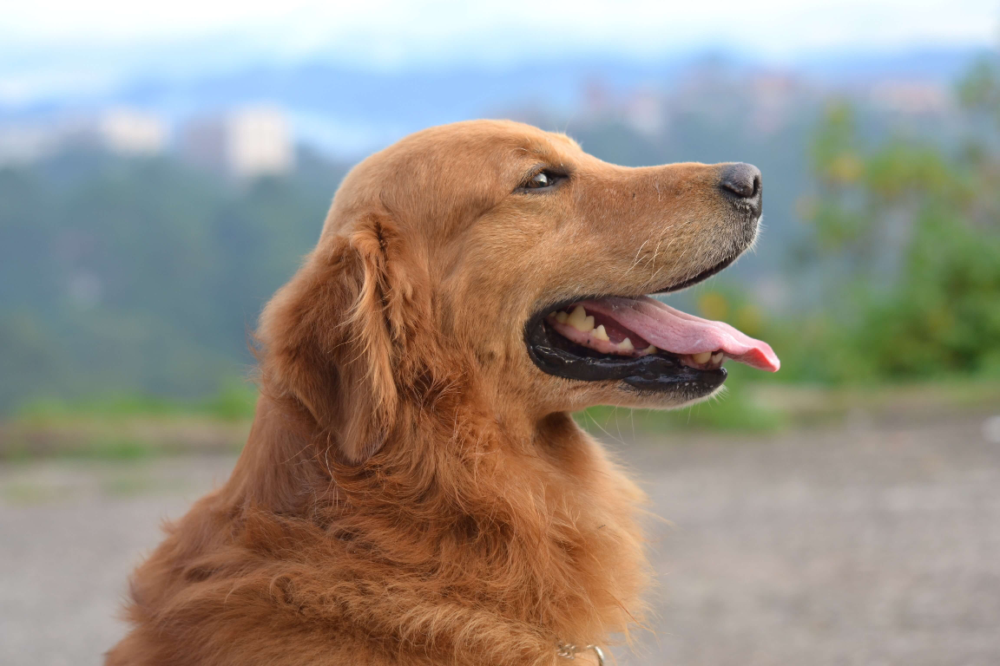

In [122]:
im

In [114]:
im.size[0] * im.size[1] / num_drawn

11.245738690529151

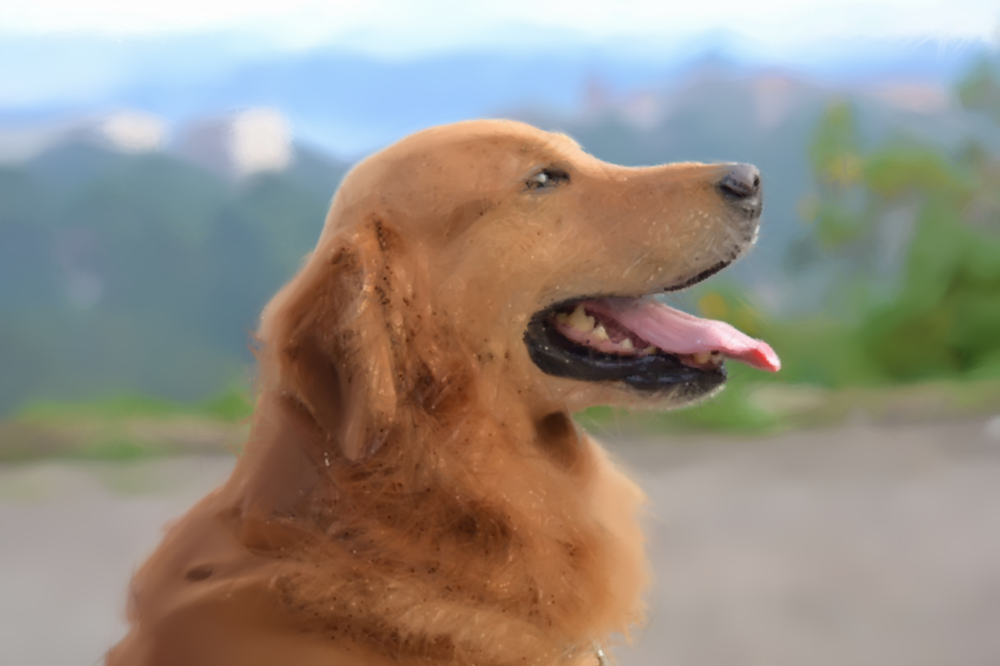

In [113]:
PIL.Image.fromarray(final_reconst.astype(np.uint8))

In [103]:
im.size[0] * im.size[1] / num_drawn

30.991172761664565

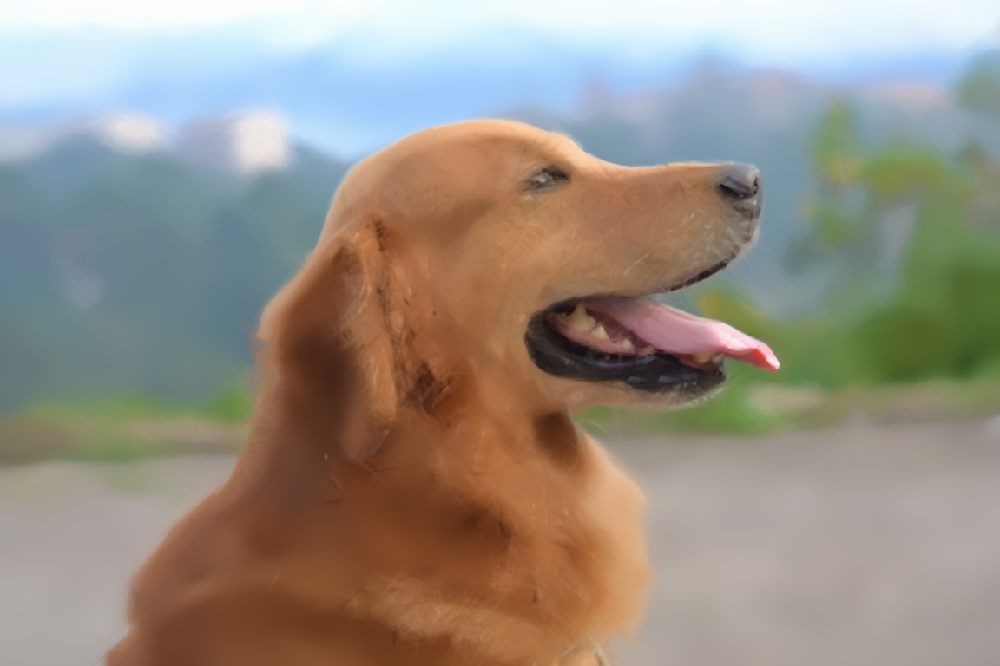

In [96]:
PIL.Image.fromarray(final_reconst.astype(np.uint8))

12.477766024962978


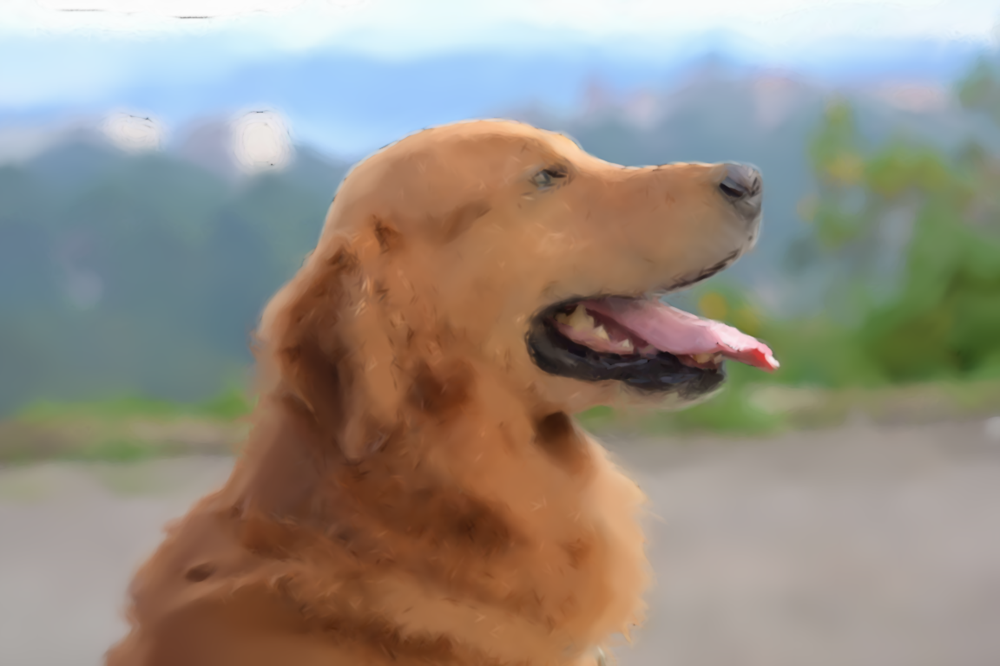

In [178]:
print(im.size[0] * im.size[1] / num_drawn)
PIL.Image.fromarray(final_reconst.astype(np.uint8))

55.089414694894145


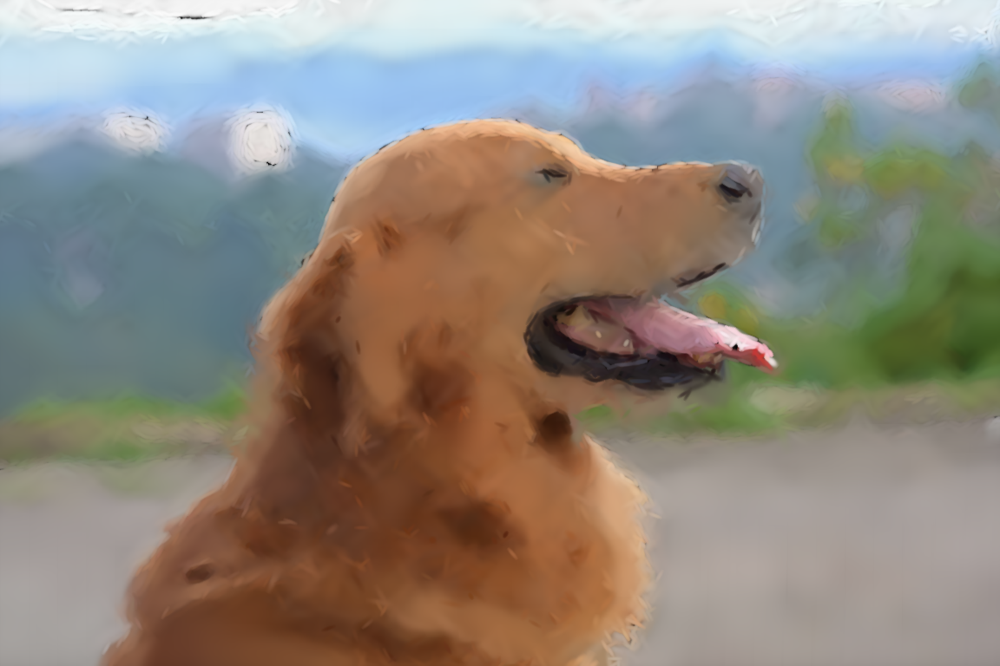

In [183]:
print(im.size[0] * im.size[1] / num_drawn)
PIL.Image.fromarray(final_reconst.astype(np.uint8))

92.45856411328248


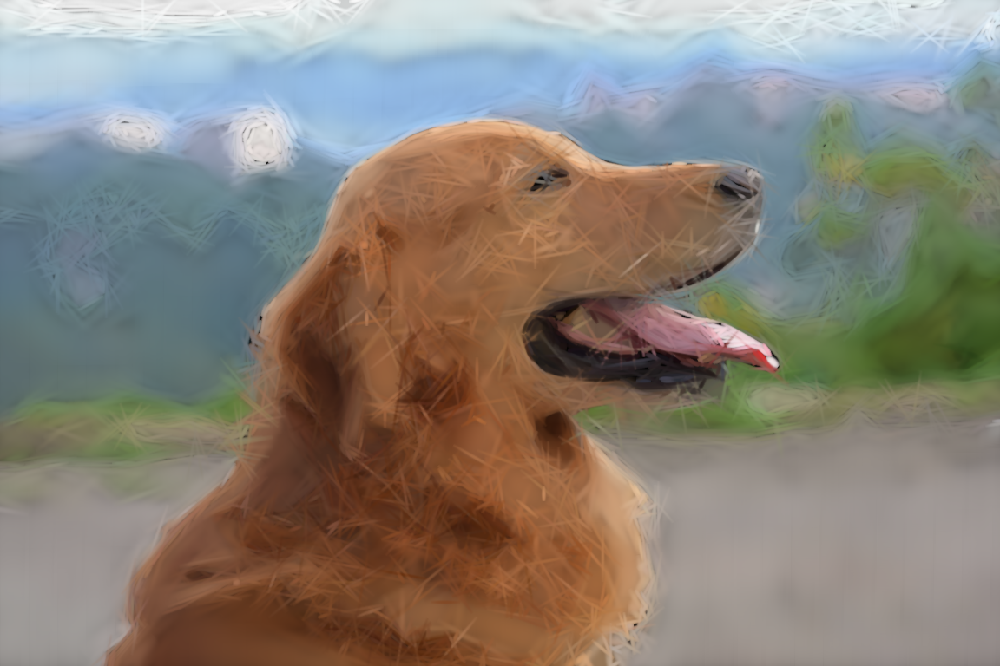

In [123]:
print(im.size[0] * im.size[1] / num_drawn)
PIL.Image.fromarray(final_reconst.astype(np.uint8))

102.68523676880223


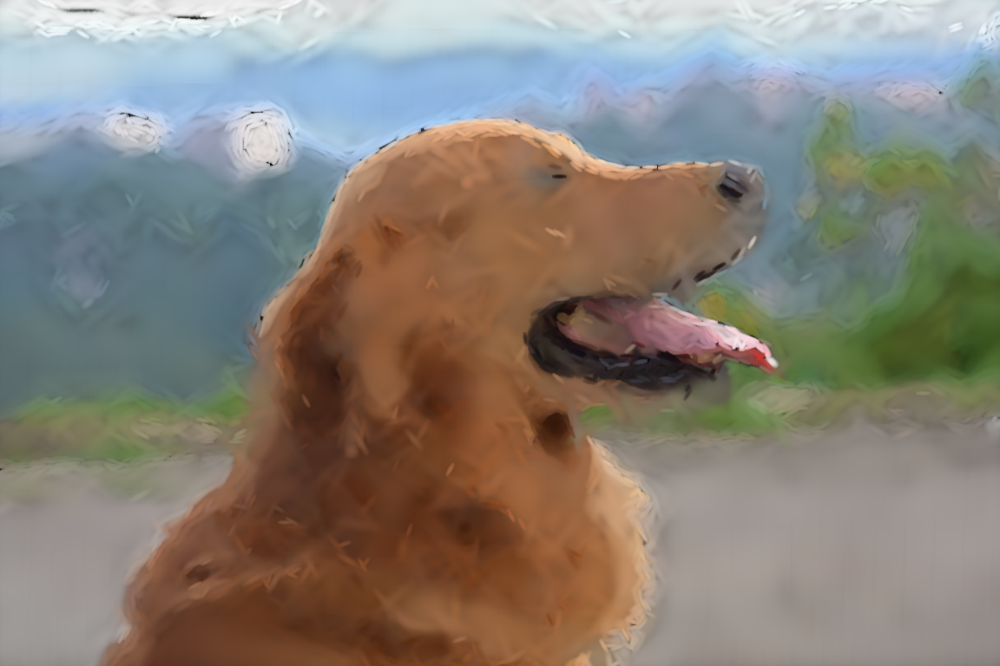

In [173]:
print(im.size[0] * im.size[1] / num_drawn)
PIL.Image.fromarray(final_reconst.astype(np.uint8))

102.19891417350121


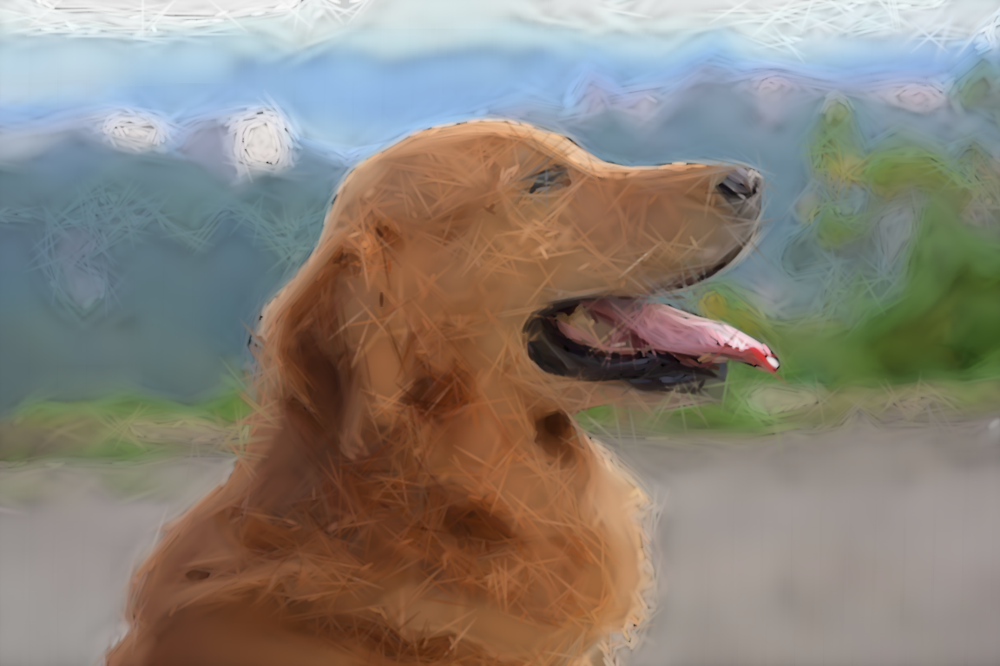

In [152]:
print(im.size[0] * im.size[1] / num_drawn)
PIL.Image.fromarray(final_reconst.astype(np.uint8))

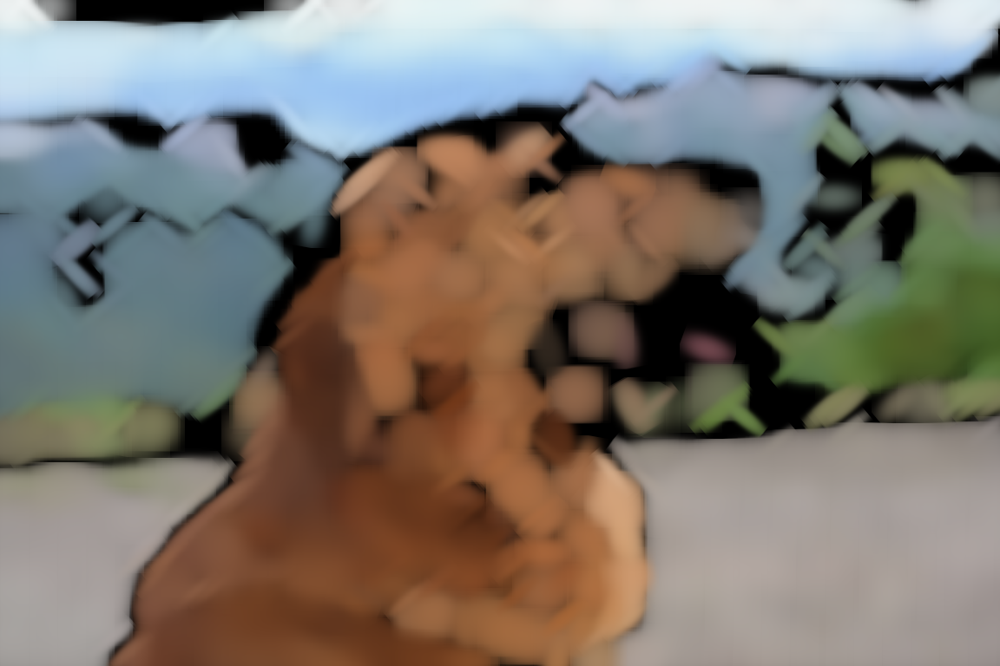

In [90]:
PIL.Image.fromarray(final_reconst.astype(np.uint8))

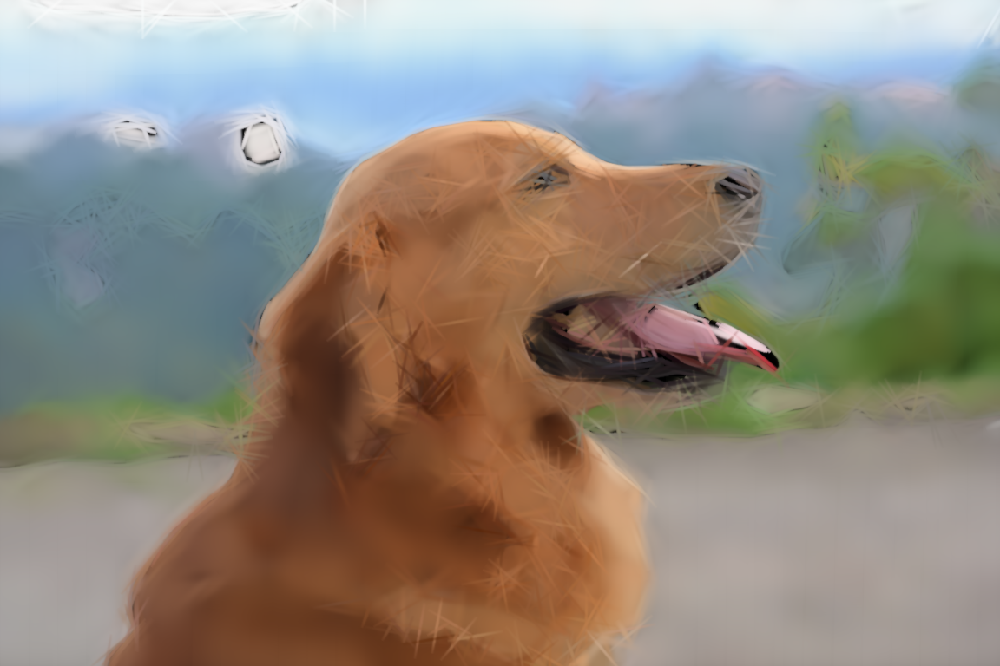

In [41]:
PIL.Image.fromarray(final_reconst.astype(np.uint8))

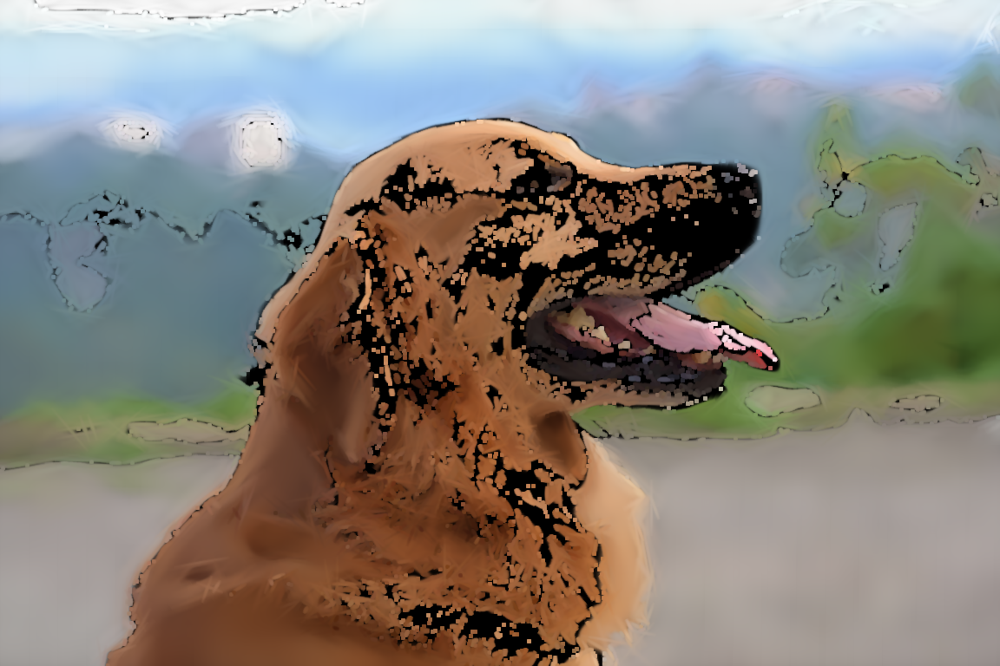

In [49]:
PIL.Image.fromarray(final_reconst.astype(np.uint8))